C:\Users\wrenfrancis\AppData\Local\Temp\ipykernel_22544\2768993927.py:25: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df2["price"]=df2["price"].str.replace("$","")


  host_response_time host_is_superhost        room_type bathrooms_text  \
0     within an hour                 f  Entire home/apt           bath   

  instant_bookable neighbourhood_cleansed       property_type  
0                f            Westminster  Entire rental unit  
19.895713415047066
29.091894088169568
36.249746055393786
22.94304868964583
24.933974402383694
7.774090878309744
18.419448770908105
0    Entire rental unit
Name: property_type, dtype: object


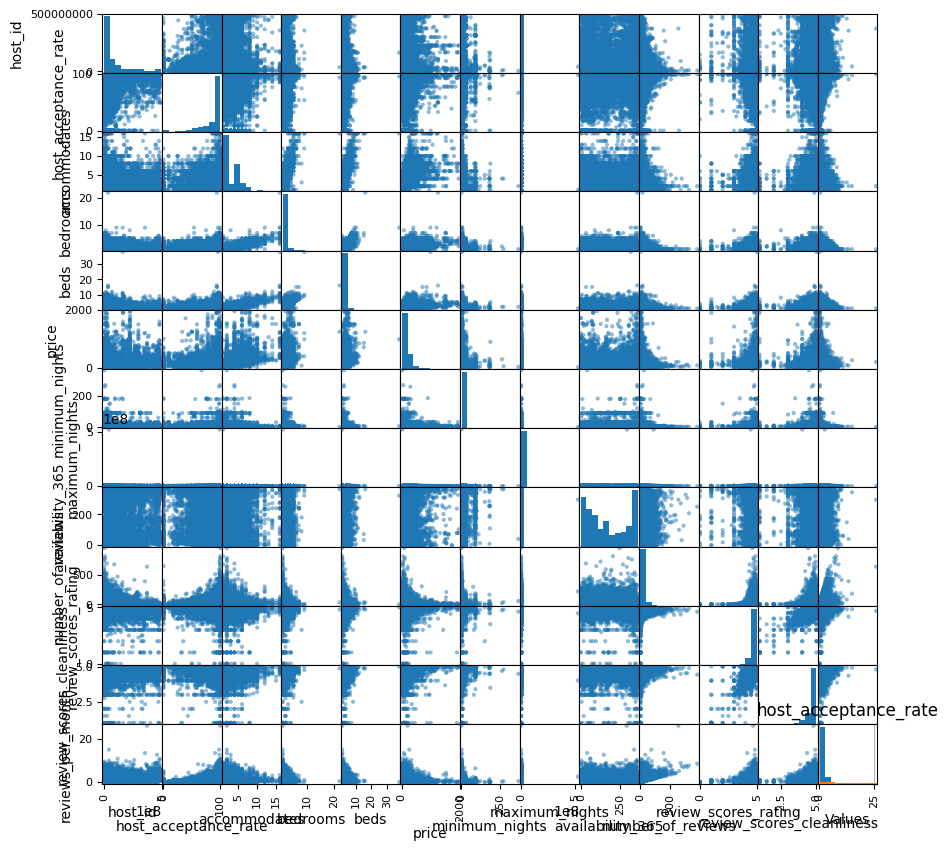

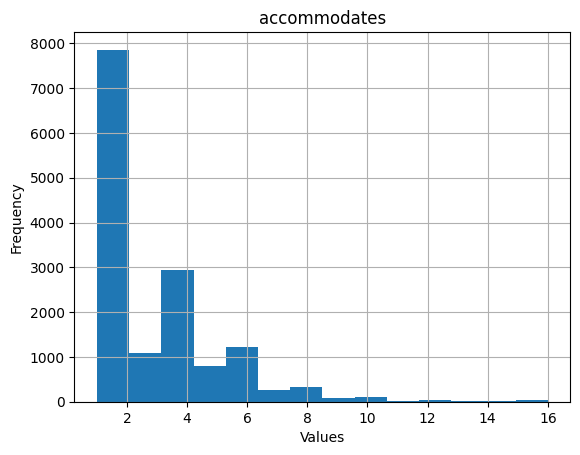

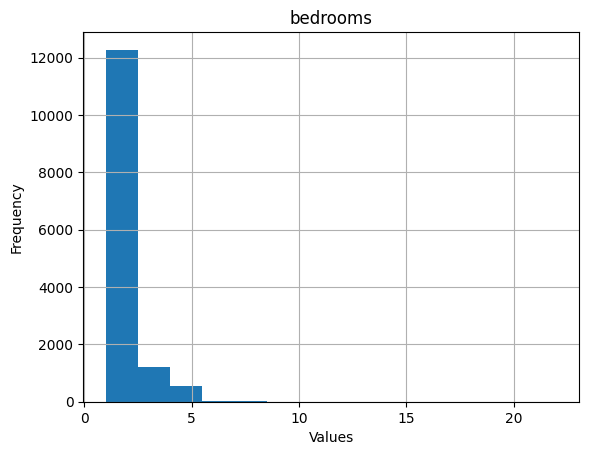

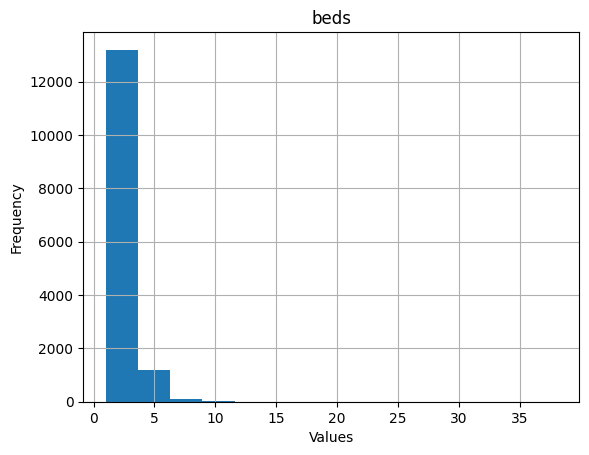

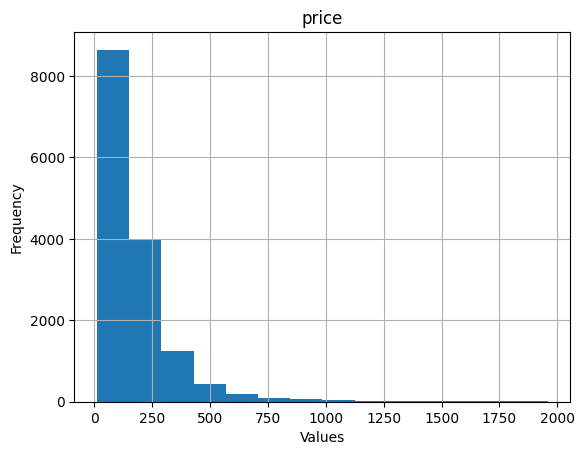

...

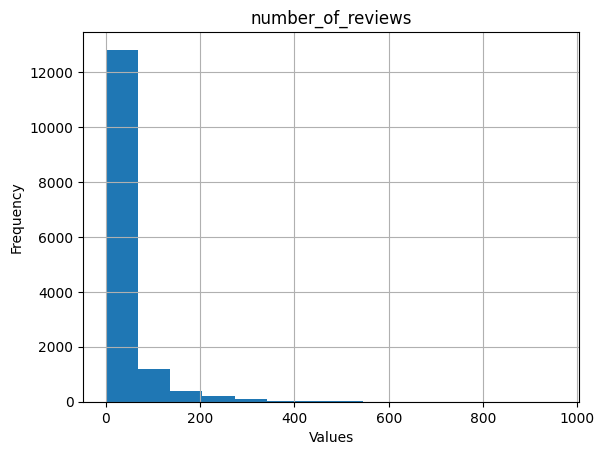

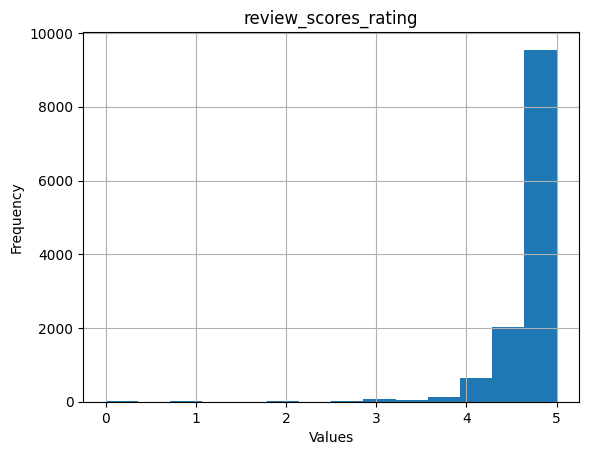

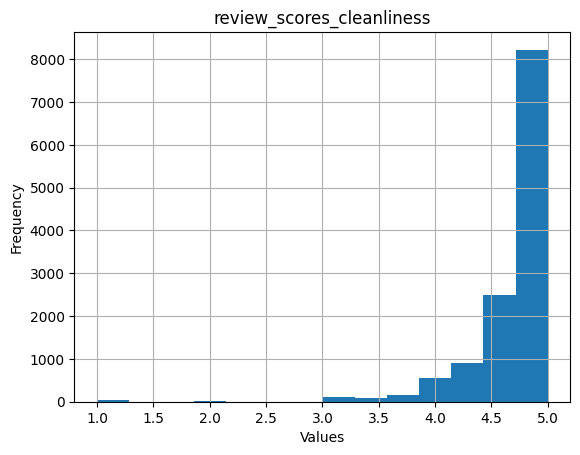

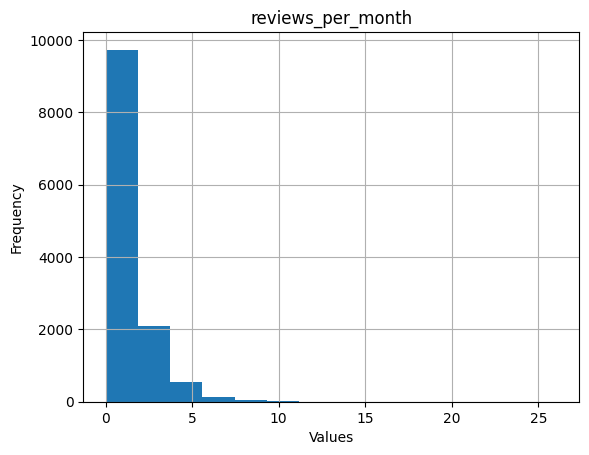

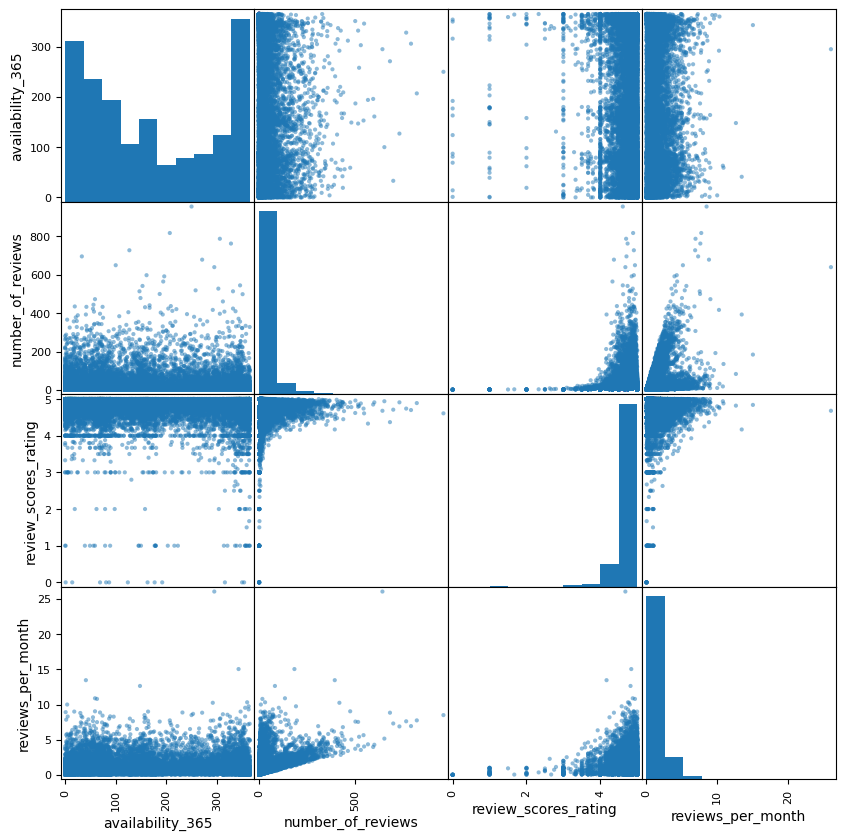

0         2.0
1         1.0
2         3.0
3         1.0
4         1.0
5         1.0
6         2.0
7         1.0
8         1.0
9         1.0
10        1.0
11        1.0
12        1.0
13        4.0
14        1.0
15        1.0
16        NaN
17        1.0
18        1.0
19        2.0
20        2.0
21        1.0
22        3.0
23        1.0
24        3.0
25        NaN
26        1.0
27        1.0
28        1.0
29        2.0
30        3.0
31        1.0
32        1.0
33        1.0
34        1.0
35        2.0
36        5.0
37        1.0
38        2.0
39        1.0
40        5.0
41        1.0
42        1.0
43        1.0
44        1.0
45        1.0
46        1.0
47        1.0
48        2.0
49        1.0
50        1.0
51        2.0
52        3.0
53        1.0
54        1.0
55        3.0
56        2.0
57        2.0
58        1.0
59        1.0
60        1.0
61        2.0
62        1.0
63        3.0
64        2.0
65        2.0
66        3.0
67        1.0
68        2.0
69        1.0
70        1.0
71    

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sns as sns
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import LabelEncoder
pd.options.display.width=None
pd.options.display.max_columns=None
pd.set_option('display.max_rows',300000)
pd.set_option('display.max_columns',300000)








df2=pd.read_csv("listings.csv",low_memory=False)
df2=df2.fillna(value=np.nan)
df2.dropna(subset=["host_response_rate"], inplace=True)


# cleaning data
df2["price"]=df2["price"].str.replace("$","")
df2["price"]=df2["price"].str.replace(",","").astype(float).astype(int)
df2["host_response_rate"]=df2["host_response_rate"].str.replace("%","").astype(int)
df2["bathrooms_text"]=df2["bathrooms_text"].str.replace('\d+','',regex=True)
df2["bathrooms_text"]=df2["bathrooms_text"].str.replace('. ','',regex=True)
df2["bathrooms_text"]=df2["bathrooms_text"].str.replace(' baths',' bath',regex=True)
df2["bathrooms_text"]=df2["bathrooms_text"].str.replace('baths',' bath',regex=True)
df2["bathrooms_text"]=df2["bathrooms_text"].str.replace(' sharebaths','sharebaths',regex=True)
df2["bathrooms_text"]=df2["bathrooms_text"].str.replace('  share bath','sharebaths',regex=True)
df2["bathrooms_text"]=df2["bathrooms_text"].str.replace(' share bath',' sharebath',regex=True)
df2["bathrooms_text"]=df2["bathrooms_text"].str.replace('share bath',' sharebath',regex=True)
df2["host_acceptance_rate"]=pd.to_numeric(df2["host_acceptance_rate"].str.replace("%",""),errors='coerce')

df2=df2[(df2["host_location"]=="London, United Kingdom") & (df2["source"]=="city scrape") &(df2["host_response_rate"]==100) &(df2["price"]<2000)  ]

columnstodrop=["scrape_id","source","listing_url","scrape_id","picture_url","host_url","host_thumbnail_url","host_picture_url","calendar_last_scraped","license","description","neighbourhood_group_cleansed","neighbourhood","host_about","host_location","neighborhood_overview","last_review","first_review","number_of_reviews_l30d","number_of_reviews_ltm","availability_90","availability_60","availability_30","has_availability","calendar_updated","maximum_nights_avg_ntm","minimum_nights_avg_ntm","maximum_maximum_nights","minimum_maximum_nights","maximum_minimum_nights","minimum_minimum_nights","amenities","bathrooms","host_has_profile_pic","host_verifications","name","id","longitude","latitude","review_scores_value","calculated_host_listings_count_entire_homes","calculated_host_listings_count_shared_rooms","host_name","host_since","host_response_rate","host_total_listings_count","host_identity_verified","calculated_host_listings_count","calculated_host_listings_count_private_rooms","host_listings_count","review_scores_accuracy","review_scores_checkin","review_scores_communication","review_scores_location","last_scraped","host_neighbourhood"]
df2.drop(columnstodrop,axis="columns",inplace=True)






max_value = df2['price'].max()


listcoulumns=["host_response_time","host_is_superhost","room_type","bathrooms_text","instant_bookable","neighbourhood_cleansed","property_type"]


print(df2[listcoulumns].mode())


for item in listcoulumns:

    print((df2[item].value_counts().iloc[1]/df2.shape[0])*100)




# --------------------------corellation scatter

pd.plotting.scatter_matrix(df2,figsize=(10,10))
# plt.show()




print(df2["property_type"].mode())

listcontinues=["host_acceptance_rate","accommodates","bedrooms","beds","price","minimum_nights","maximum_nights","availability_365","number_of_reviews","review_scores_rating","review_scores_cleanliness","reviews_per_month"]


# -------------cardinality issue------------- high for user id drop the colum
df2.drop("host_id",inplace=True,axis=1)







for item in listcontinues:
    abc = int(1 + 3.22 * np.log10(df2.shape[0]))
    df2[item].hist(bins=abc)
    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.title(item)
    plt.show()





# ------------missing value for categorical attribute filling with mode
modebat=df2["bathrooms_text"].mode()[0]
df2["bathrooms_text"].replace(np.nan,modebat,inplace=True)








cols = ["availability_365","number_of_reviews","review_scores_rating","reviews_per_month"]

data = df2[cols]

data.corr

pd.plotting.scatter_matrix(data, figsize=(10,10))
plt.show()

df2['reviews_per_month'] = df2['reviews_per_month'].fillna(0)

cleanliness_mean = np.mean(df2['review_scores_cleanliness'])
rating_mean = np.mean(df2['review_scores_rating'])
df2['review_scores_cleanliness'] = df2['review_scores_cleanliness'].fillna(cleanliness_mean)
df2['review_scores_rating'] = df2['review_scores_rating'].fillna(rating_mean)

df2.to_csv("london.csv")
df2=pd.read_csv("london.csv",low_memory=False)
print(df2['beds'])





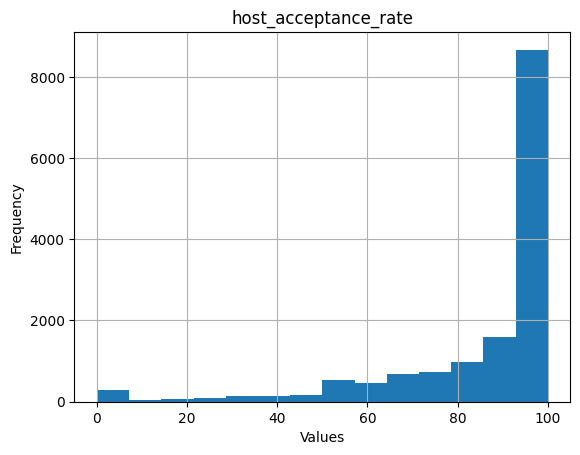

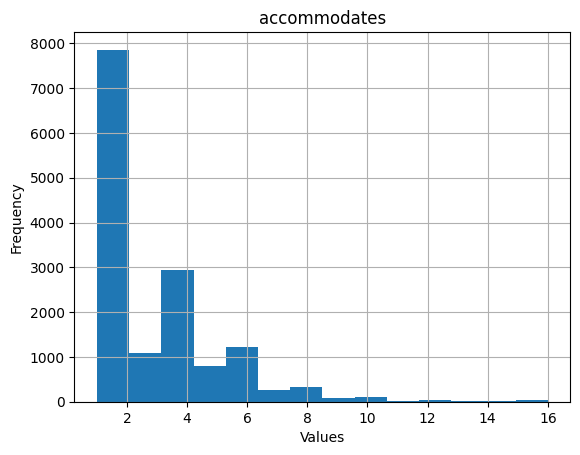

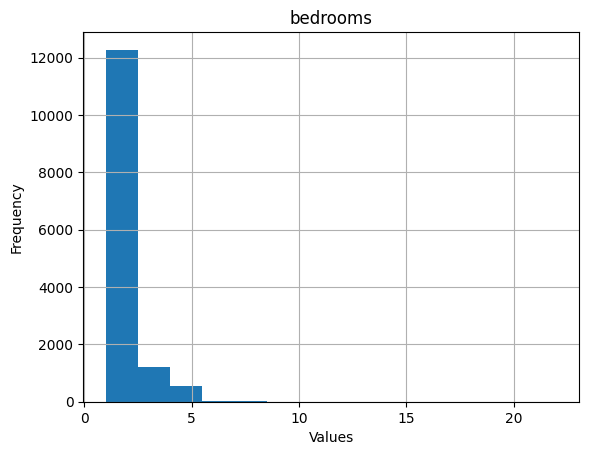

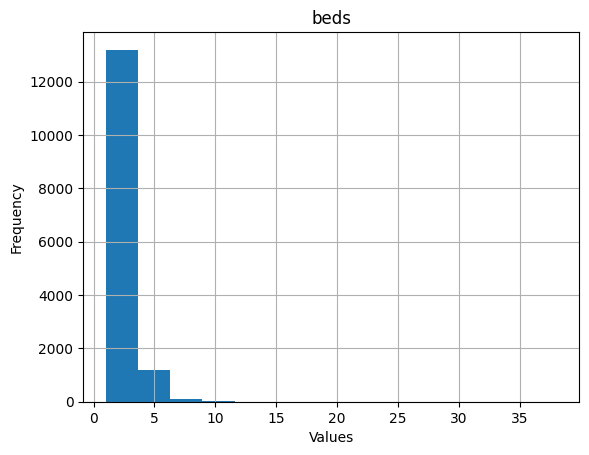

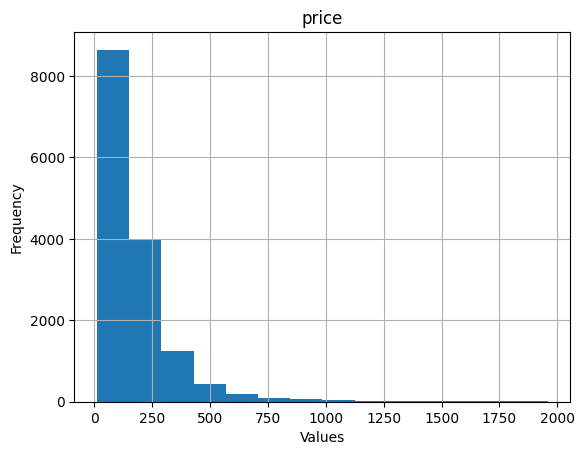

...

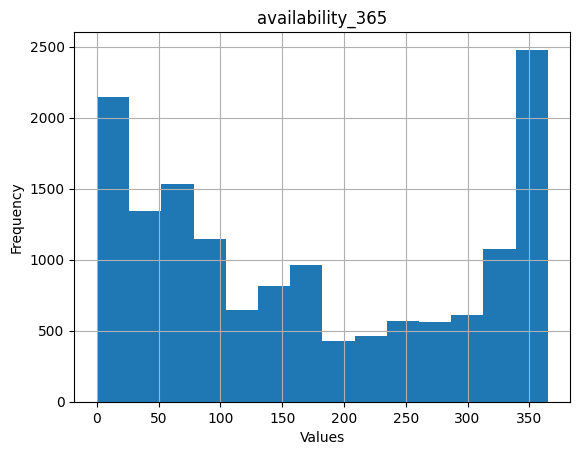

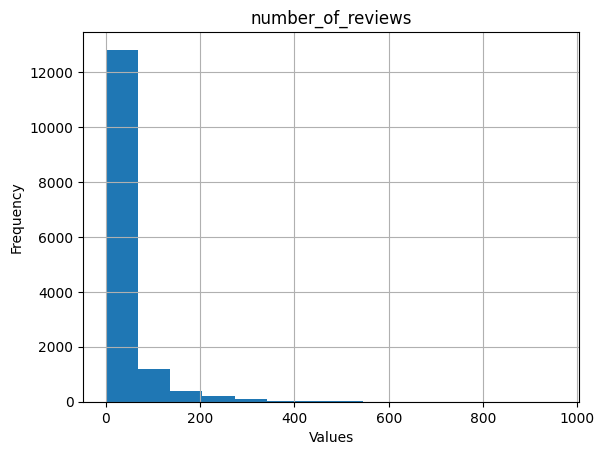

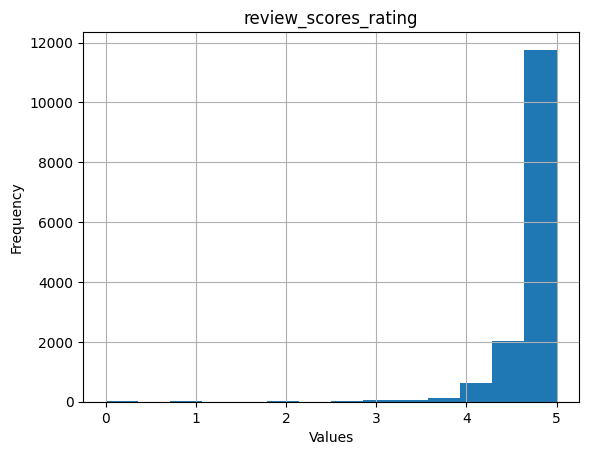

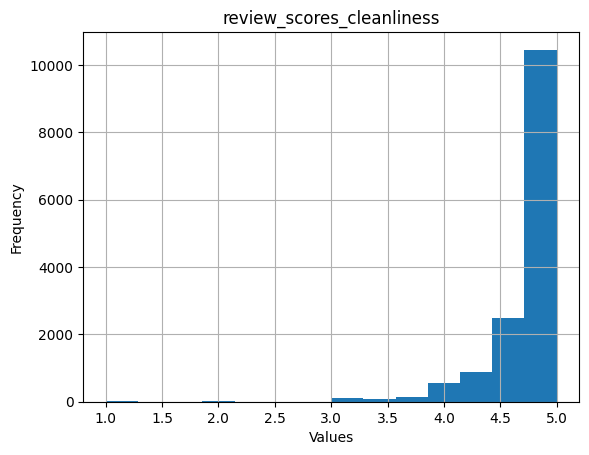

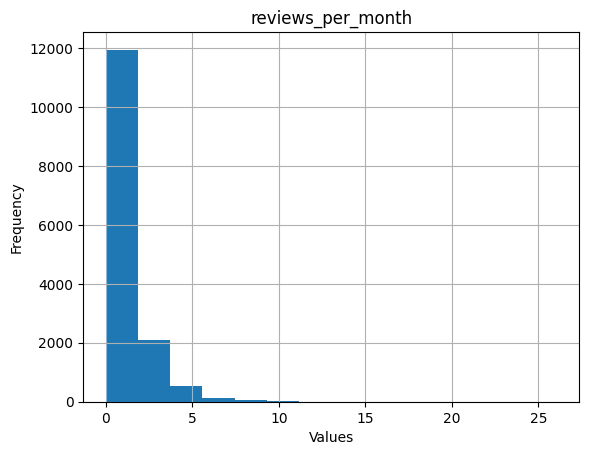

C:\Users\wrenfrancis\AppData\Local\Temp\ipykernel_22544\2630425465.py:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df2.corr()


In [3]:



for item in listcontinues:
    abc = int(1 + 3.22 * np.log10(df2.shape[0]))
    df2[item].hist(bins=abc)
    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.title(item)
    plt.show()

corr_matrix = df2.corr()














room_type           Entire home/apt  Hotel room  Private room  Shared room
host_response_time                                                        
within a day                    953           0           458            3
within a few hours             1763           1          1169            5
within an hour                 6647           8          3726           34
room_type          Entire home/apt  Hotel room  Private room  Shared room
host_is_superhost                                                        
f                             7069           8          3362           32
t                             2294           1          1991           10


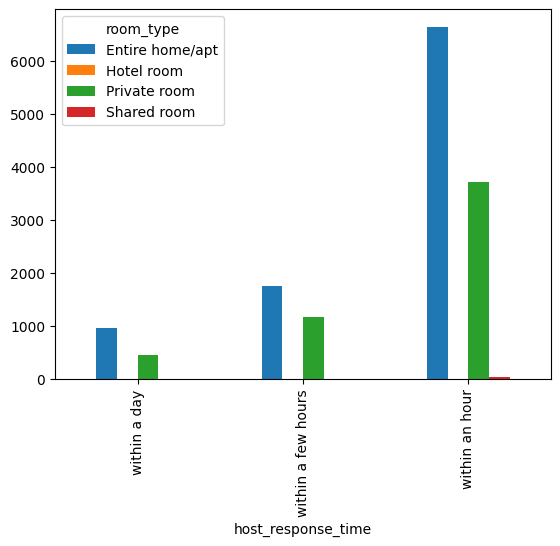

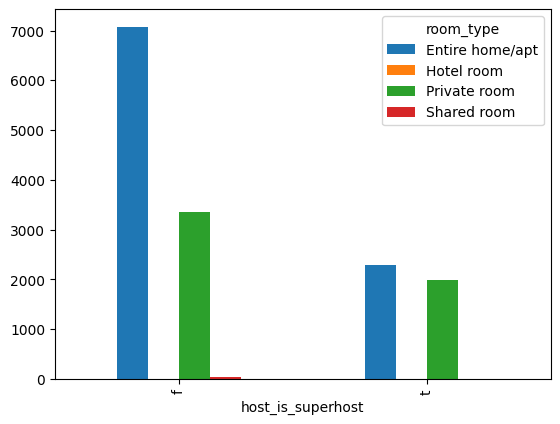

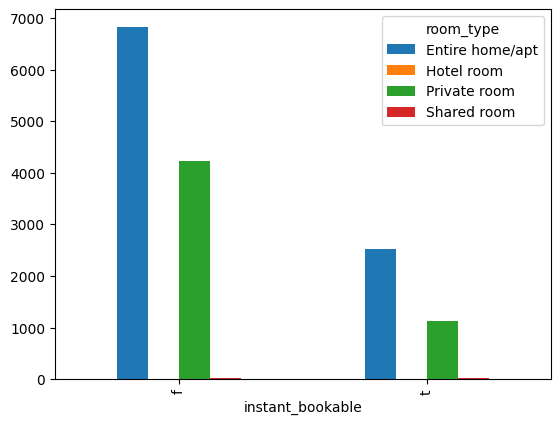

<Figure size 1000x600 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [4]:

# question 6:  ATTRIBUTE DEPENDENCY
# Using the bar plot type diagram, give some (2-3) examples of attribute dependency and
# comment the results.

# host_response_time and Room type
# tend to understand if the host response time is fast or not depends on the room type

print(pd.crosstab(df2['host_response_time'],df2['room_type']))
pd.crosstab(df2['host_response_time'],df2['room_type']).plot(kind='bar')

# rents more entire home than private room if host is not a superhost
print(pd.crosstab(df2['host_is_superhost'],df2['room_type']))
pd.crosstab(df2['host_is_superhost'],df2['room_type']).plot(kind='bar')

# number of private rooms booked is higher when the listing is not instantly bookable.
pd.crosstab(df2['instant_bookable'],df2['room_type']).plot(kind='bar')

# instantly bookable if not superhost
pd.crosstab(df2['instant_bookable'],df2['host_is_superhost'])

pd.crosstab(df2['host_response_time'],df2['instant_bookable'])



# there are many more "Entire condo" listings in Hammersmith and Fulham than in other neighborhoods, and many more "Room in aparthotel" listings in Tower Hamlets
plt.figure(figsize=(10,6))
pd.crosstab(df2['neighbourhood_cleansed'],df2['property_type'])


plt.show()
plt.savefig('neighbourhood_property.jpeg')


price            (10.053, 109.35]  (109.35, 206.7]  (206.7, 304.05]  \
room_type                                                             
Entire home/apt              1483             4121             1967   
Hotel room                      4                3                2   
Private room                 4586              613               93   
Shared room                    39                0                1   

price            (304.05, 401.4]  (401.4, 498.75]  (498.75, 596.1]  \
room_type                                                            
Entire home/apt              770              370              216   
Hotel room                     0                0                0   
Private room                  24                9               13   
Shared room                    0                0                1   

price            (596.1, 693.45]  (693.45, 790.8]  (790.8, 888.15]  \
room_type                                                            
Entire home/

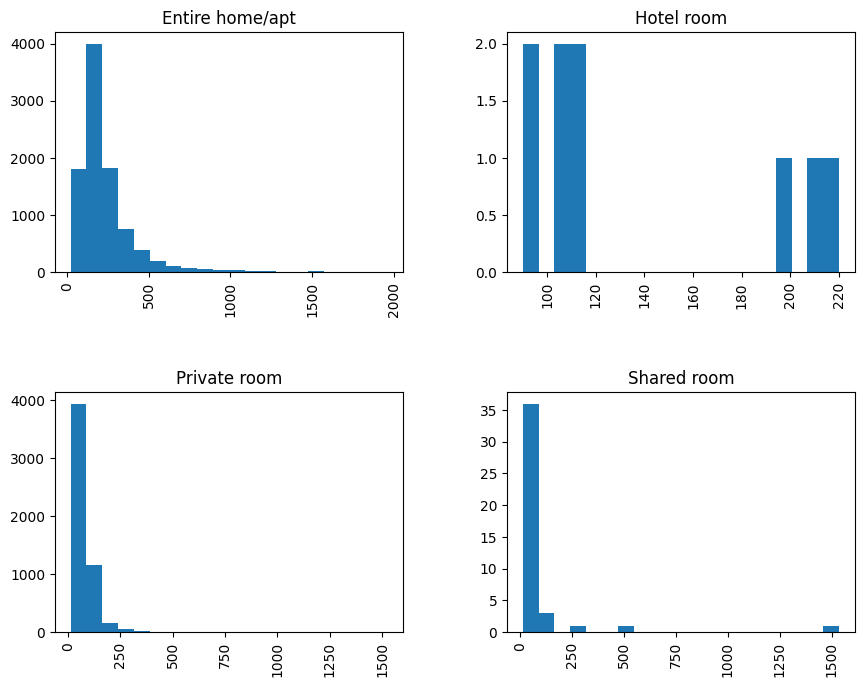

C:\Users\wrenfrancis\AppData\Local\Temp\ipykernel_22544\4074128234.py:17: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df2.hist(column='price', by='property_type', bins=20, ax=ax2)


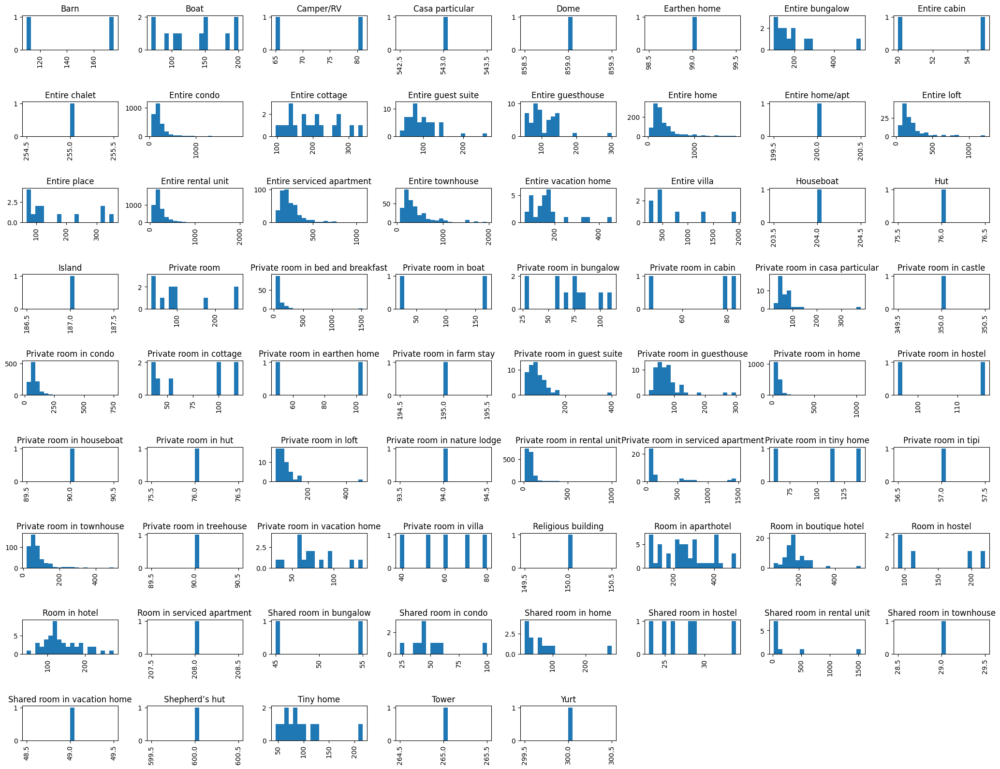

C:\Users\wrenfrancis\AppData\Local\Temp\ipykernel_22544\4074128234.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2_sub["price"]=pd.cut(df2['price'],bins=range(0,2000,100))


property_type  Barn  Boat  Camper/RV  Casa particular  Dome  Earthen home  \
price                                                                       
(0, 100]          0     3          2                0     0             1   
(100, 200]        2     8          0                0     0             0   
(200, 300]        0     0          0                0     0             0   
(300, 400]        0     0          0                0     0             0   
(400, 500]        0     0          0                0     0             0   
(500, 600]        0     0          0                1     0             0   
(600, 700]        0     0          0                0     0             0   
(700, 800]        0     0          0                0     0             0   
(800, 900]        0     0          0                0     1             0   
(900, 1000]       0     0          0                0     0             0   
(1000, 1100]      0     0          0                0     0             0   

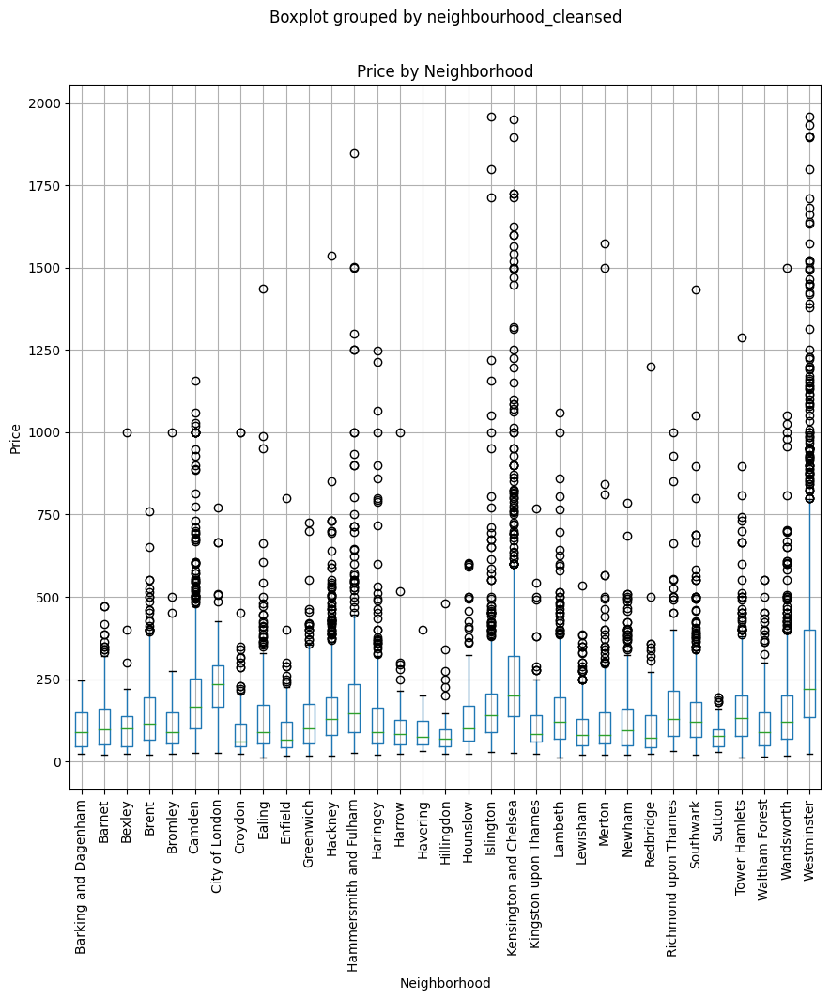

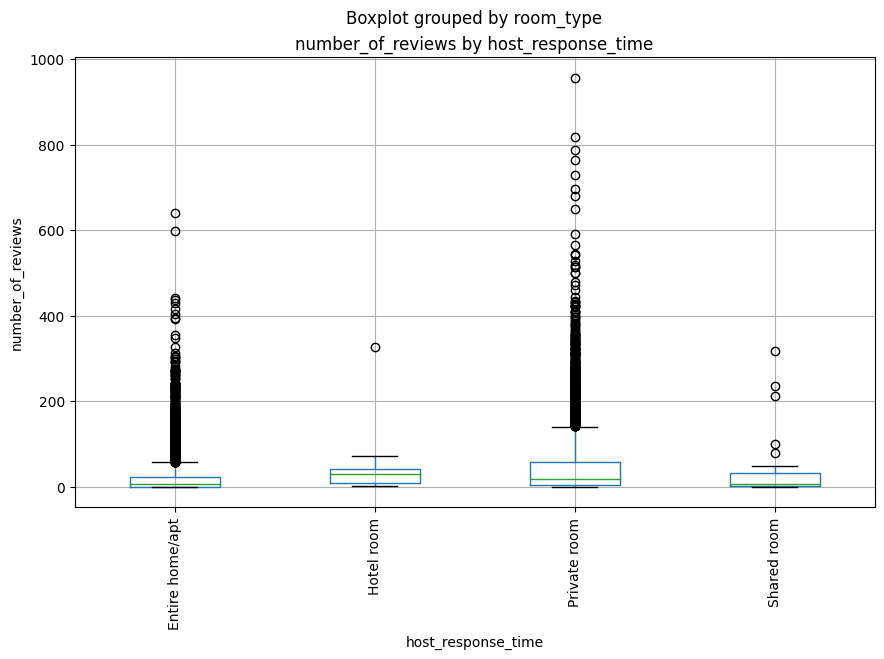

number_of_reviews    0    1    2    3    4    5    6    7    8    9    10   \
host_response_time                                                           
within a day         222  123   82   69   68   56   32   44   32   44   36   
within a few hours   397  204  149  118  107   91   99   79   68   59   59   
within an hour      1595  762  560  438  404  320  314  270  248  213  211   

number_of_reviews   11   12   13   14   15   16   17   18   19   20   21   \
host_response_time                                                          
within a day         26   28   28   22   19   28   17   14   14   12    8   
within a few hours   48   56   41   39   43   37   40   38   26   33   30   
within an hour      209  186  165  142  134  120  124  123   88   95  115   

number_of_reviews   22   23   24   25   26   27   28   29   30   31   32   \
host_response_time                                                          
within a day         16    6    8   13   12   11    7    5    8    8 

In [5]:
# Provide some (2-3) examples of histograms and box plot diagrams depicting relationships
# between categorical (see 3 fig.for reference) and continuous type variables.

grouped = df2.groupby(['room_type', pd.cut(df2['price'], bins=20)])


freq_counts = grouped.size().unstack()
freq_counts.to_csv("freq_counts.csv")


print(freq_counts)

df2.hist(column='price', by='room_type', bins=20, figsize=(10,8))
plt.show()

fig2, ax2 = plt.subplots(figsize=(25,20))
df2.hist(column='price', by='property_type', bins=20, ax=ax2)
ax2.set_ylabel('property_type count')

plt.subplots_adjust(hspace=1.5)

plt.show()


df2_sub=df2[["price","property_type"]]
df2_sub["price"]=pd.cut(df2['price'],bins=range(0,2000,100))

conttable=pd.crosstab(df2_sub['price'],df2_sub["property_type"])
print(conttable)

conttable.to_csv("conttable.csv")
# westminister and kingstyon have the highest number of listings for the hishest price
fig, ax = plt.subplots(figsize=(10,10))
df2.boxplot(column='price', by='neighbourhood_cleansed', ax=ax)



ax.set_title('Price by Neighborhood')
ax.set_ylabel('Price')
ax.set_xlabel('Neighborhood')
plt.xticks(rotation=90)

plt.show()

fig, ax = plt.subplots(figsize=(10,6))
df2.boxplot(column='number_of_reviews', by='room_type', ax=ax)
ax.set_title('number_of_reviews by host_response_time')
ax.set_ylabel('number_of_reviews')
ax.set_xlabel('host_response_time')
plt.xticks(rotation=90)
plt.show()

table = pd.crosstab(df2.host_response_time, df2.number_of_reviews)
print(table)

C:\Users\wrenfrancis\AppData\Local\Temp\ipykernel_22544\3331863004.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df2.corr()


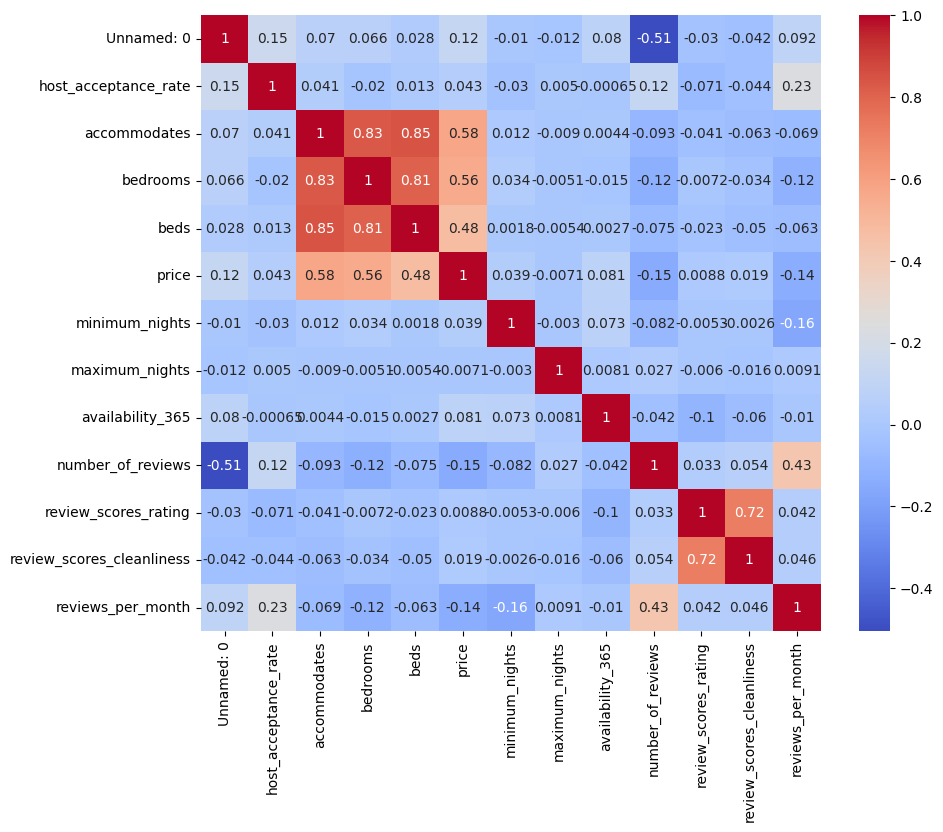

In [6]:
import seaborn as sns

plt.figure(figsize=(10,8))
corr = df2.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()


In [7]:
# solving the missing value beds using regression imputation


from sklearn.linear_model import LinearRegression

df_missing=df2[df2["beds"].isnull()]


df_notmissing=df2[df2["beds"].notnull()]

a=df_notmissing["accommodates"].values.reshape(-1,1)
b=df_notmissing["beds"].values.reshape(-1,1)
reg = LinearRegression().fit(a, b)

pred=df_missing["accommodates"].values.reshape(-1,1)
predbed = reg.predict(pred)

# only returns loc beds column and replace the null values with the predicted values
df2.loc[df2['beds'].isnull(),'beds']=predbed.flatten().round(0)
df2.to_csv('londnregression.csv', index=False)

In [8]:

# solving the missing value bedrooms using regression imputation

df_missingbedroom=df2[df2["bedrooms"].isnull()]


df_notmissingbedroom=df2[df2["bedrooms"].notnull()]

abedroom=df_notmissingbedroom["accommodates"].values.reshape(-1,1)
bbedroom=df_notmissingbedroom["bedrooms"].values.reshape(-1,1)
regbedroom = LinearRegression().fit(abedroom, bbedroom)

predbedroom=df_missingbedroom["accommodates"].values.reshape(-1,1)
predbedroom = regbedroom.predict(predbedroom)

# only returns loc bedroom column and replace the null values with the predicted values
df2.loc[df2['bedrooms'].isnull(),'bedrooms']=predbedroom.flatten().round(0)
df2.to_csv('londnregression.csv', index=False)




In [9]:
# solving the missing value median and mode

# fill missing values with the median for it not to affect the distribution , not with regression since theres no correlation
df2['host_acceptance_rate'].fillna(df2['host_acceptance_rate'].median(), inplace=True)
# print(df2.corr())

# we can see that the charecteristics have not changed after imputation

# since bathroom text is a categorical variable, we can use mode to fill the missing values

df2['bathrooms_text'].fillna(df2['bathrooms_text'].mode()[0], inplace=True)

In [10]:
# covariences
cov_matrix = df2.cov()
cov_matrix.to_csv("cov_matrix.csv")

# calculate correlation matrix


# print covariance matrix
print("Covariance matrix:\n", cov_matrix)

Covariance matrix:
                              Unnamed: 0  host_acceptance_rate  accommodates  \
Unnamed: 0                 4.772895e+08          70954.704039   3136.118758   
host_acceptance_rate       7.095470e+04            447.526019      1.740380   
accommodates               3.136119e+03              1.740380      4.189756   
bedrooms                   1.196530e+03             -0.482046      1.525585   
beds                       8.100916e+02              0.342580      2.226562   
price                      4.696354e+05            163.231980    209.823043   
minimum_nights            -3.035941e+03             -7.999106      0.325384   
maximum_nights            -1.174007e+09         454564.098529 -79263.654721   
availability_365           2.208961e+05             -3.273344      1.146788   
number_of_reviews         -6.368110e+05            141.088917    -10.974196   
review_scores_rating      -2.411347e+02             -0.554379     -0.031472   
review_scores_cleanliness -3.370

C:\Users\wrenfrancis\AppData\Local\Temp\ipykernel_22544\227934980.py:2: FutureWarning: The default value of numeric_only in DataFrame.cov is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cov_matrix = df2.cov()


In [11]:
# normalisation
contival=['host_acceptance_rate','accommodates','bedrooms','beds','price','minimum_nights','maximum_nights','availability_365','number_of_reviews','review_scores_rating','review_scores_cleanliness','reviews_per_month']

df2_norm=df2.copy()
for item in contival:
    df2_norm[item]=(df2_norm[item]-df2_norm[item].min())/(df2_norm[item].max()-df2_norm[item].min())

print(df2_norm)

       Unnamed: 0  host_response_time  host_acceptance_rate host_is_superhost  \
0               3      within an hour                  0.96                 f   
1               4  within a few hours                  0.99                 t   
2               5  within a few hours                  0.96                 t   
3               7      within an hour                  0.83                 t   
4               8  within a few hours                  1.00                 t   
5               9      within an hour                  0.57                 f   
6              12      within an hour                  0.40                 f   
7              13  within a few hours                  0.56                 f   
8              14      within an hour                  0.99                 t   
9              18      within an hour                  1.00                 f   
10             22  within a few hours                  0.94                 t   
11             26  within a 

In [12]:

from sklearn.preprocessing import LabelEncoder


categorical_value=['host_response_time','host_is_superhost','room_type','bathrooms_text','instant_bookable','neighbourhood_cleansed','property_type']
for item in categorical_value:
    df2[item]=LabelEncoder().fit_transform(df2[item])

df2.to_csv('londontransformed.csv', index=False)


abcd
   availability_365  number_of_reviews  review_scores_rating  \
0               111                199                  4.74   
1               303                528                  4.88   
2               241                 54                  4.76   
3               350                224                  4.73   
4                19                123                  4.85   

   reviews_per_month  
0               1.44  
1               3.55  
2               0.38  
3               1.95  
4               0.98  


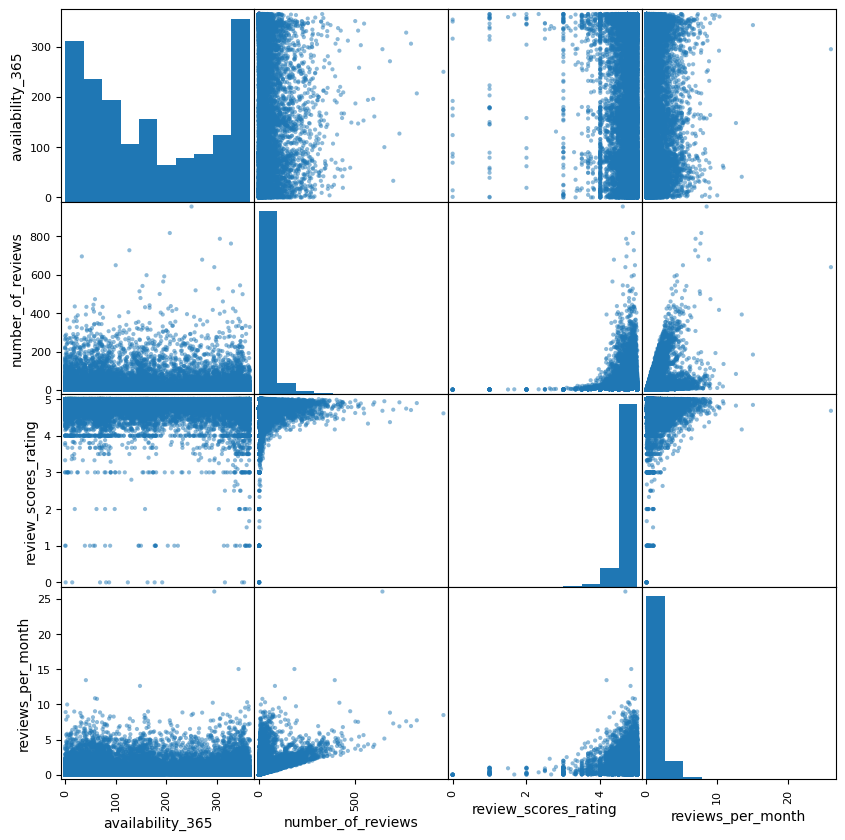

In [13]:

cols = ["availability_365","number_of_reviews","review_scores_rating","reviews_per_month"]

data = df2[cols]
print("abcd")

print(data.head())


pd.plotting.scatter_matrix(data, figsize=(10,10))
plt.show()
